# Image processing

## Excercise 1: Image segmentation

Load an RGB image from the file `candy.jpg`. Count the number of objects of different colors.

##### Useful Link: https://www.oreilly.com/library/view/practical-computer-vision/9781449337865/ch04.html
##### Useful Link: https://pysptools.sourceforge.io/abundance_maps.html#unconstrained-least-squares-ucls

In [1]:
#!pip install cv2
%pylab inline
import cv2
import scipy.signal

Populating the interactive namespace from numpy and matplotlib


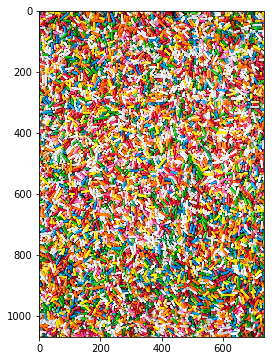

In [2]:
%matplotlib inline
img = imread('candy.jpg')
f = plt.figure(figsize=(10, 6))
plt.imshow(img);

In [3]:
img.shape
img[0:10,0:10,0]

array([[  6,  23,   0,   0,   0,   0,   1,  35, 152, 248],
       [  0,  30,   6,   0,   0,   0,   6,  32, 135, 245],
       [  5,  41,   8,   0,   0,   2,  14,  33, 114, 238],
       [  0,  40,  17,   0,   0,   5,  16,  46, 108, 220],
       [  0,   2,  12,   4,   1,   0,  10,  52, 118, 200],
       [  0,   0,   0,   0,  13,  26,  43,  75, 132, 182],
       [ 29,   4,   0,   1,  26,  70,  98, 114, 135, 167],
       [ 26,   8,  10,   4,  10,  59, 102, 118, 128, 155],
       [  6,   0,   0,   1,  19,  44,  80, 114, 115, 145],
       [  0,   0,   0,   1,  10,  35,  79, 119, 125, 138]], dtype=uint8)

{'red': 208753, 'green': 128280, 'blue': 44149, 'black': 70319, 'yellow': 335283, 'no match': 0}


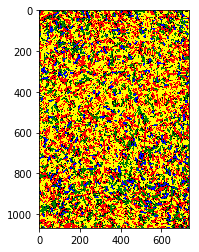

In [4]:
%matplotlib inline
import numpy as np
from matplotlib import colors
from scipy.spatial import cKDTree as KDTree
from scipy.misc import face

REDUCED_COLOR_SPACE = True

# borrow a list of named colors from matplotlib
if REDUCED_COLOR_SPACE:
    use_colors = {k: colors.cnames[k] for k in ['red', 'green', 'blue', 'black', 'yellow', 'purple']}
else:
    use_colors = colors.cnames

# translate hexstring to RGB tuple
named_colors = {k: tuple(map(int, (v[1:3], v[3:5], v[5:7]), 3*(16,)))
                for k, v in use_colors.items()}
ncol = len(named_colors)

if REDUCED_COLOR_SPACE:
    ncol -= 1
    no_match = named_colors.pop('purple')
else:
    no_match = named_colors['purple']

# make an array containing the RGB values 
color_tuples = list(named_colors.values())
color_tuples.append(no_match)
color_tuples = np.array(color_tuples)

color_names = list(named_colors)
color_names.append('no match')

# get example picture
img = imread('candy.jpg')

# build tree
tree = KDTree(color_tuples[:-1])
# tolerance for color match `inf` means use best match no matter how
# bad it may be
tolerance = np.inf
# find closest color in tree for each pixel in picture
dist, idx = tree.query(img, distance_upper_bound=tolerance)
# count and reattach names
counts = dict(zip(color_names, np.bincount(idx.ravel(), None, ncol+1)))

print(counts)

import pylab

pylab.imshow(img)
pylab.savefig('orig.png')
pylab.clf()
pylab.imshow(color_tuples[idx])
pylab.savefig('minimal.png' if REDUCED_COLOR_SPACE else 'reduced.png')

## Excercise 2: Image correction

Load an RGB image from `mountain.jpg` and try to transform the histogram until the image looks good to you.

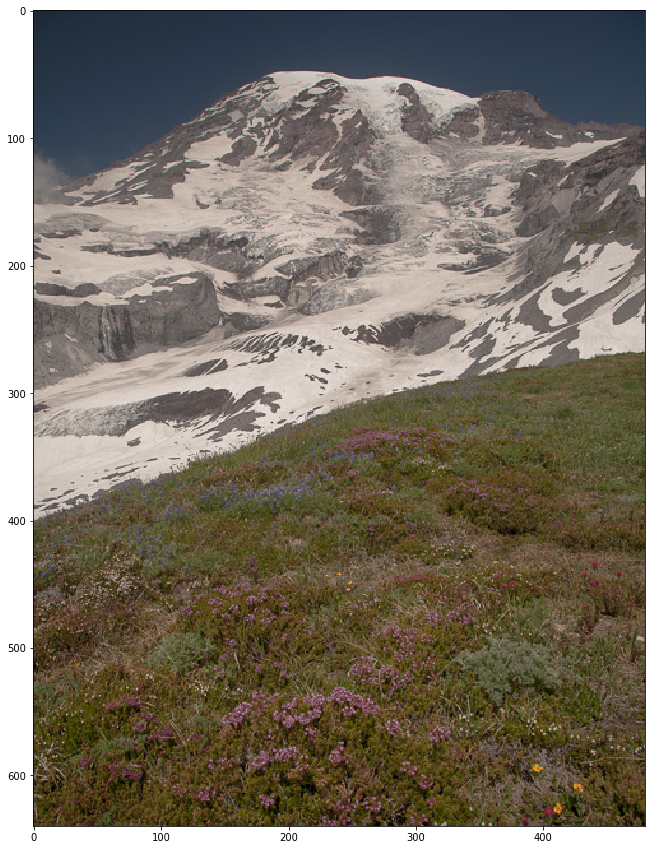

In [5]:
%matplotlib inline
img = imread('mountain.jpg')
f = figure(figsize=(15,15))
plt.imshow(img);

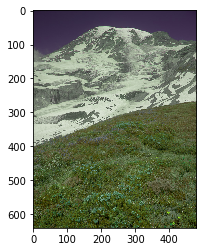

In [6]:
import matplotlib.pyplot as plt
import cv2
import matplotlib
%matplotlib inline

img = plt.imread('mountain.jpg')
plt.imshow(img[..., [1,0,2]])
plt.show()

In [7]:
#!pip install opencv-python --user

In [8]:
# Morphological filtering
from skimage.morphology import opening
from skimage.morphology import disk
from PIL import Image

# Data handling
import numpy as np

# Connected component filtering
import cv2

black = 0
white = 255
threshold = 160

# Open input image in grayscale mode and get its pixels.
img = imread('mountain.jpg')
pixels = np.array(img)[:,:,0]

# Remove pixels above threshold
pixels[pixels > threshold] = white
pixels[pixels < threshold] = black


# Morphological opening
blobSize = 1 # Select the maximum radius of the blobs you would like to remove
structureElement = disk(blobSize)  # you can define different shapes, here we take a disk shape
# We need to invert the image such that black is background and white foreground to perform the opening
pixels = np.invert(opening(np.invert(pixels), structureElement))


# Create and save new image.
newImg = Image.fromarray(pixels).convert('RGB')
newImg.save("newImage1.PNG")

# Find the connected components (black objects in your image)
# Because the function searches for white connected components on a black background, we need to invert the image
nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(np.invert(pixels), connectivity=8)

# For every connected component in your image, you can obtain the number of pixels from the stats variable in the last
# column. We remove the first entry from sizes, because this is the entry of the background connected component
sizes = stats[1:,-1]
nb_components -= 1

# Define the minimum size (number of pixels) a component should consist of
minimum_size = 100

# Create a new image
newPixels = np.ones(pixels.shape)*255

# Iterate over all components in the image, only keep the components larger than minimum size
for i in range(1, nb_components):
    if sizes[i] > minimum_size:
        newPixels[output == i+1] = 0

# Create and save new image.
newImg = Image.fromarray(newPixels).convert('RGB')
newImg.save("newImage2.PNG")

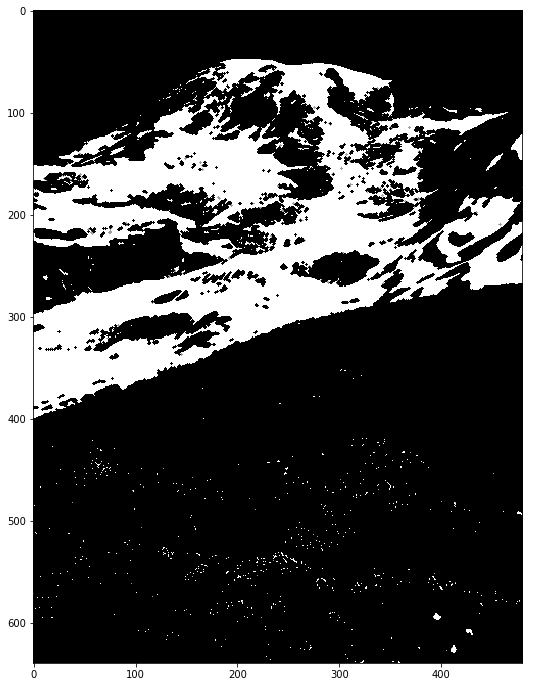

In [9]:
%matplotlib inline
img = imread('newImage1.PNG')
f = figure(figsize = (12,12))
plt.imshow(img);


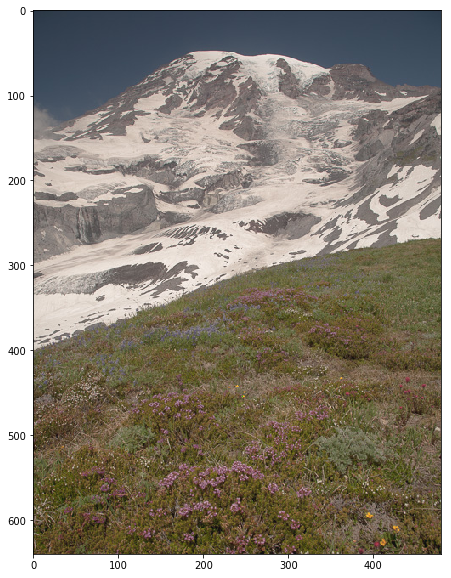

In [10]:
%matplotlib inline
img = imread('mountain.jpg')
f = figure(figsize=(10,10))
plt.imshow(np.uint8(15 + img));

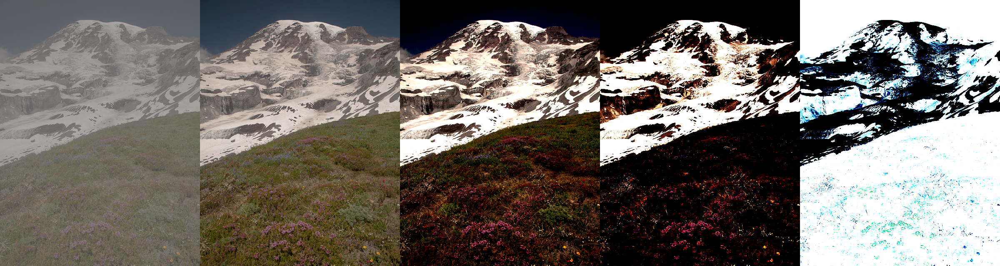

In [11]:
%matplotlib inline
def change_contrast(img, level):
    factor = (259 * (level + 255)) / (255 * (259 - level))
    def contrast(c):
        value = 128 + factor * (c - 128)
        return max(0, min(255, value))
    return img.point(contrast)

def change_contrast_multi(img, steps):
    width, height = img.size
    canvas = Image.new('RGB', (width * len(steps), height))
    for n, level in enumerate(steps):
        img_filtered = change_contrast(img, level)
        canvas.paste(img_filtered, (width * n, 0))
    return canvas

change_contrast_multi(Image.open('mountain.jpg'), [-100, 0, 100, 200, 300])

## Excercise 3: Sudoku

Load an RGB image from `sudoku.jpg` and convert it to grayscale. Try to find the border of the sudoku table and correct the perspective (and maybe the camera lens distortion) until the table looks as rectangular as possible. Find the squares containing numbers. How would you recognize the numbers from python?

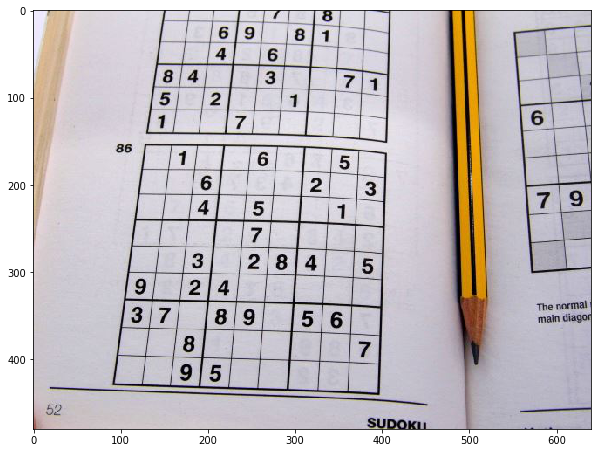

In [12]:
%matplotlib inline
img = imread('sudoku.jpg')
f = figure(figsize=(10,12))
plt.imshow(img);

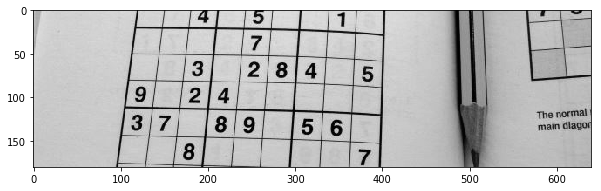

In [13]:
%matplotlib inline
fname = 'sudoku.jpg'
image = Image.open(fname).convert("L")
arr = np.asarray(image)
arr = arr[100:400][120:420]
f = figure(figsize=(10,10))
plt.imshow(arr, cmap='gray', vmin=0, vmax=255)
plt.show();


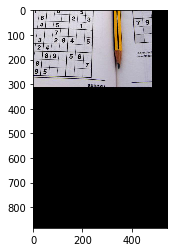

In [14]:
from PIL import Image
def crop(image_path, coords, saved_location):
    image_obj = Image.open(image_path)
    cropped_image = image_obj.crop(coords)
    cropped_image.save(saved_location)
    cropped_image.show()

if __name__ == '__main__':
    image = 'sudoku.jpg'
    crop(image, (161, 166, 706, 1050), 'cropped.jpg')

cropped = Image.open('cropped.jpg')    
plt.imshow(cropped, cmap='gray', vmin=0, vmax=255)
plt.show();   

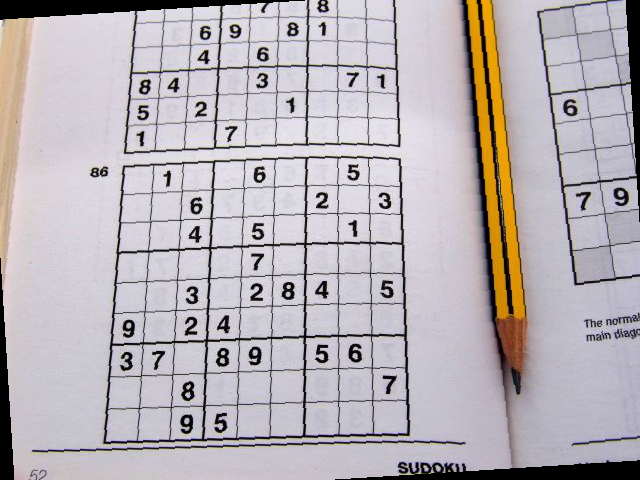

In [15]:
#sudoku = cv2.imread('sudoku.jpg')
sudoku = Image.open('sudoku.jpg')
sudoku = sudoku.rotate(3.6)
#f = figsize(15,15)
#plt.imshow(sudoku[..., [0,0,0]])
sudoku

For detecting any kind of border we will use 3 methods: grayscale + gaussianBlur + Canny - result - black and white image. The reason: the high difference between black and white colors(high gradient).  

In [16]:
import cv2
sudoku = cv2.imread('sudoku.jpg')
sudoku_gray = cv2.cvtColor(sudoku, cv2.COLOR_RGB2GRAY)
sudoku_blur = cv2.GaussianBlur(sudoku_gray, (5,5), 0)
sudoku_canny = cv2.Canny(sudoku_blur, 50, 1)

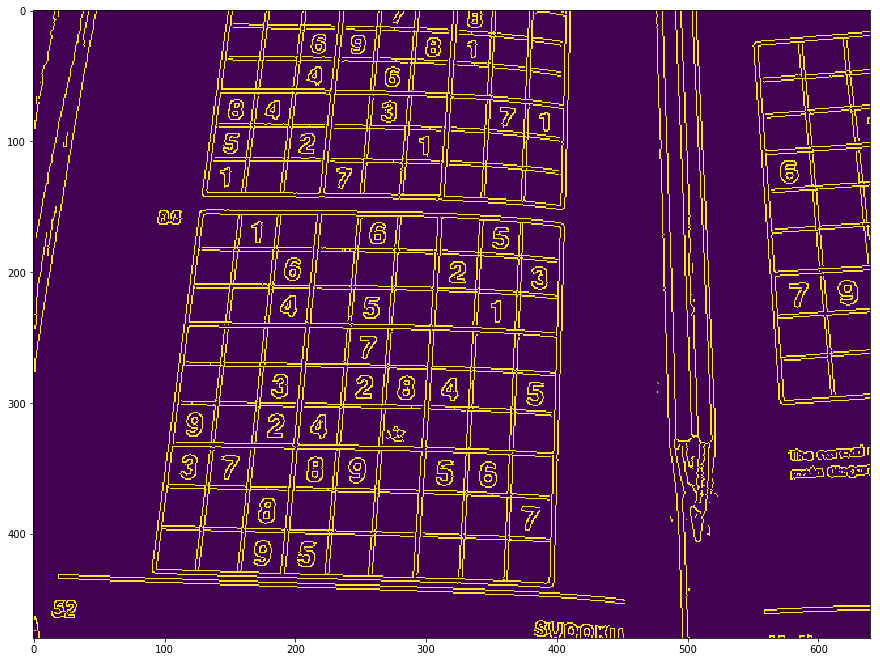

In [17]:
f = figure(figsize(15,15))
plt.imshow(sudoku_canny)
plt.show()

## Excercise 4: Count the ratio of yellow and black Airsoft BBs

<img src="AirsoftBB.png">

There are several images of a mixture of Airsoft BBs in `/home/course/ImageExploration/SmallBalls/`. These images are from a granular segregation experiment, where the balls have different surface roughness according to their color and therefore the friction varies as well while the content of the bowl was stirred. 

Try to distinguish between the two kind of balls and find out their ratio in each image! 


In [22]:
Smallballs_1 = imread('Smallballs-1.jpg')
Smallballs_2 = imread('Smallballs-2.jpg')
Smallballs_3 = imread('Smallballs-3.jpg')
Smallballs_4 = imread('Smallballs-4.jpg')

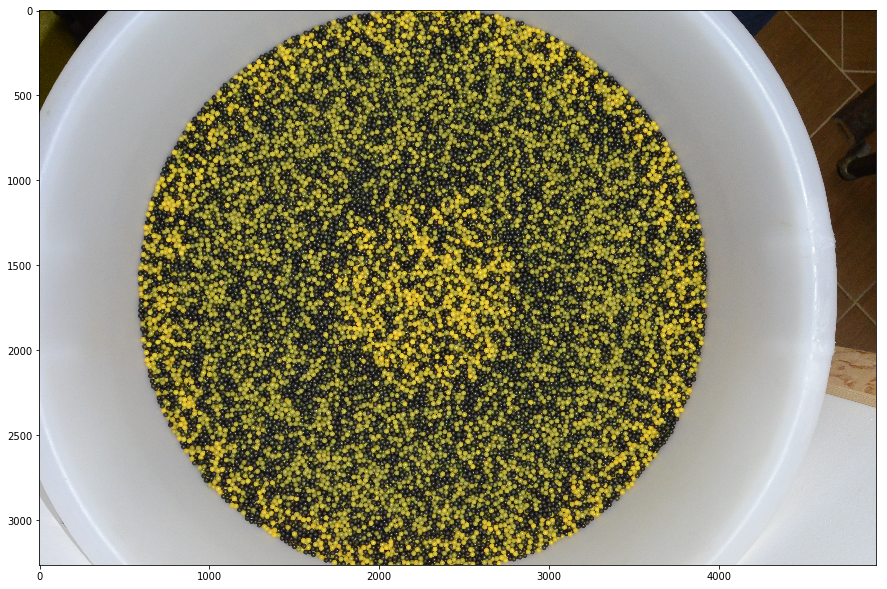

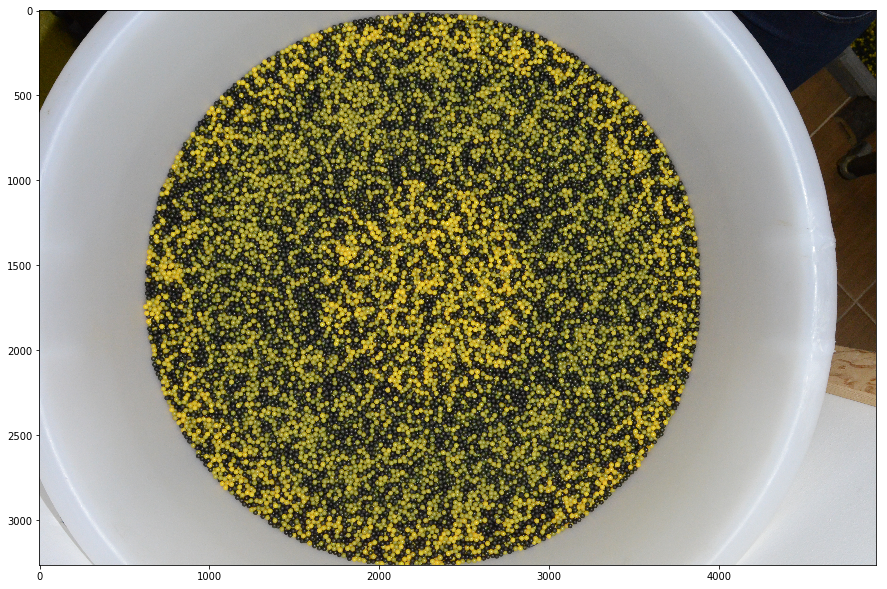

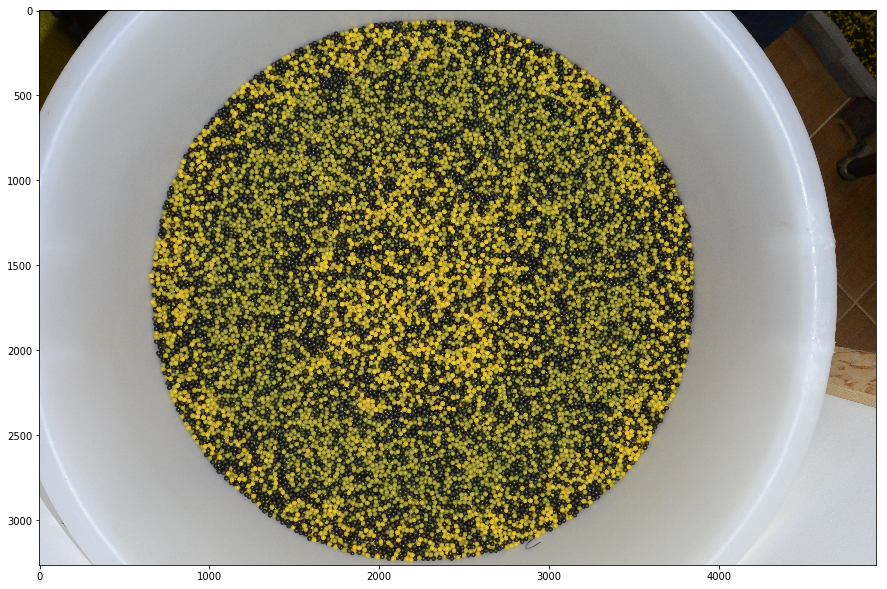

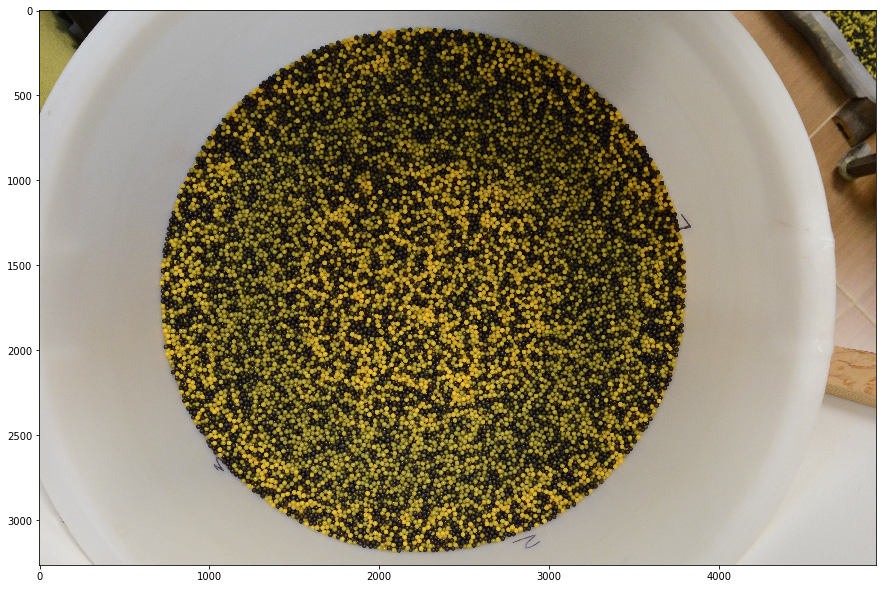

In [30]:
plt.imshow(Smallballs_1)
plt.show()
plt.imshow(Smallballs_2)
plt.show()
plt.imshow(Smallballs_3)
plt.show()
plt.imshow(Smallballs_4)
plt.show()


In [1]:
!pip install --user scikit-image

In [3]:
!pip install --user imutils

  Stored in directory: /home/v249c6/.cache/pip/wheels/b2/40/59/139d450e68847ef2f27d876d527b13389dac23df0f66526b5d
Successfully built imutils


In [21]:
# # import the necessary packages
# from skimage.measure import compare_ssim
# import argparse
# import imutils
# import cv2
 
# # construct the argument parse and parse the arguments
# ap = argparse.ArgumentParser()
# ap.add_argument("-f", "-Smallballs-1.jpg", required = True, help = "first input image")
# ap.add_argument("-s", "-Smallballs-2.jpg", required = True, help = "second")
# args = vars(ap.parse_args())


In [22]:
# # load the two input images
# imageA = cv2.imread(args["Smallballs-1.jpg"])
# imageB = cv2.imread(args["Smallballs-2.jpg"])
 
# # convert the images to grayscale
# grayA = cv2.cvtColor(imageA, cv2.COLOR_BGR2GRAY)
# grayB = cv2.cvtColor(imageB, cv2.COLOR_BGR2GRAY)

link about comparing images: https://scikit-image.org/docs/dev/api/skimage.measure.html

In [31]:
def mse(imageA, imageB):
# the 'Mean Squared Error' between the two images is the
# sum of the squared difference between the two images;
# NOTE: the two images must have the same dimension
    err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
    err /= float(imageA.shape[0] * imageA.shape[1])
# return the MSE, the lower the error, the more "similar"
# the two images are
    return err

In [32]:
def compare_images(image_a, image_b, title):
    # compute the mean squared error and structural similarity
    # index for the images
    m = mse(image_a, image_b)
    s = compare_ssim(image_a, image_b, multichannel=True)

    # setup the figure
    fig = plt.figure(title)
    plt.suptitle("MSE: %.2f, SSIM: %.2f" % (m, s))

    # show first image
    ax = fig.add_subplot(1, 2, 1)
    plt.imshow(image_a, cmap=plt.cm.gray)
    plt.axis("off")

    # show the second image
    ax = fig.add_subplot(1, 2, 2)
    plt.imshow(image_b, cmap=plt.cm.gray)
    plt.axis("off")

    # show the images
    plt.show() 

In [34]:
#compare_images(cv2.imread('Smallballs-1.jpg'), cv2.imread('Smallballs-2.jpg'), 'test')

In [35]:
# import the necessary packages
from skimage.measure import structural_similarity as ssim
import matplotlib.pyplot as plt
import numpy as np
import cv2

In [49]:
# import the necessary packages
from skimage.measure import structural_similarity as ssim
import matplotlib.pyplot as plt
import numpy as np
import cv2

def mse(imageA, imageB):
# the 'Mean Squared Error' between the two images is the
# sum of the squared difference between the two images;
# NOTE: the two images must have the same dimension
    err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
    err /= float(imageA.shape[0] * imageA.shape[1])
# return the MSE, the lower the error, the more "similar"
# the two images are
    return err

def compare_images(imageA, imageB, title):
# compute the mean squared error and structural similarity
# index for the images
    m = mse(imageA, imageB)
    s = ssim(imageA, imageB)

# setup the figure
    fig = plt.figure(title)
    plt.suptitle("MSE: %.2f, SSIM: %.2f" % (m, s))

# show first image
    ax = fig.add_subplot(1, 2, 1)
    plt.imshow(imageA, cmap = plt.cm.gray)
    plt.axis("off")

# show the second image
    ax = fig.add_subplot(1, 2, 2)
    plt.imshow(imageB, cmap = plt.cm.gray)
    plt.axis("off")

# show the images
    plt.show()

In [47]:
# load the images -- the original, the original + contrast,
# and the original + photoshop
original = cv2.imread("Smallballs-1.jpg")
contrast = cv2.imread("Smallballs-2.jpg")
shopped = cv2.imread("Smallballs-3.jpg")
 
#convert the images to grayscale
original = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)
contrast = cv2.cvtColor(contrast, cv2.COLOR_BGR2GRAY)
shopped = cv2.cvtColor(shopped, cv2.COLOR_BGR2GRAY)


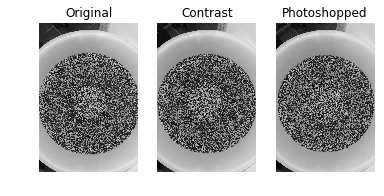

/opt/conda/lib/python3.6/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


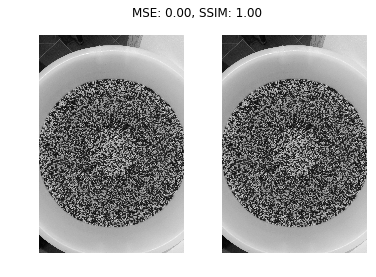

/opt/conda/lib/python3.6/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


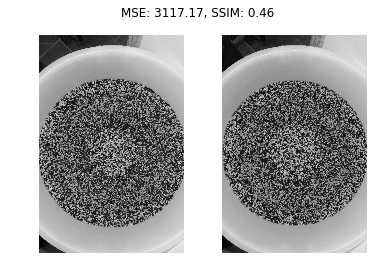

/opt/conda/lib/python3.6/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


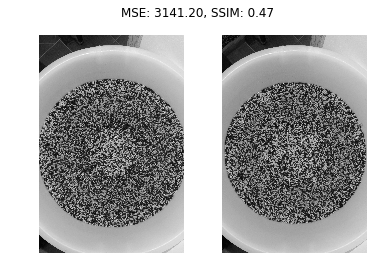

In [48]:
# initialize the figure
fig = plt.figure("Images")
images = ("Original", original), ("Contrast", contrast), ("Photoshopped", shopped)
 
# loop over the images
for (i, (name, image)) in enumerate(images):
	# show the image
	ax = fig.add_subplot(1, 3, i + 1)
	ax.set_title(name)
	plt.imshow(image, cmap = plt.cm.gray)
	plt.axis("off")
 
# show the figure
plt.show()
 
# compare the images
compare_images(original, original, "Original vs. Original")
compare_images(original, contrast, "Original vs. Contrast")
compare_images(original, shopped, "Original vs. Photoshopped")